In [48]:
# Ucitavanje potrebnih biblioteka
import numpy as np 
import cv2
import matplotlib.pyplot as  plt
import matplotlib.image as mpimg
%matplotlib inline

import glob
from moviepy.editor import VideoFileClip
from IPython.display import HTML

## Kalibracija kamere & Distorzija slike (Camera calibration and image distortion)

__Distorsija slike__ najčesce se može primetiti deformacija linija i pojavljivanja zakrivljenosti istih. Sa korišcenjem objektiva kamere dobijamo kvalitetiniju sliku ali objektivi kreiraju distorzije na slici. Postoje dva osnovna tipa distorzija:

- 1. __Radijalna distorzija__: Ovaj tip nastaje usled nejednakog savijanja svetla. Zraci se savijaju više blizu ivica objektiva nego na centralnom delu istog. Usled toga linije koje su prave u realnom svetu izgledaju zakrivljenene na slikama. Postoje dva osnovna tipa radijelne distorsije:
       - 1.1. Barrel distorzija - sto odgovata negativnom radijalnom pomeranju
       - 1.2 Pincushion distorsion - sto odgovata pozitivnom radijalnom pomeranju
- 2. __Tangencionalna distorrzija__: Uglavnom se pojavljuje kada je ekran postavljen pod  nekim uglom u odnosu na socivo. Efekti ovog oblika su nategnutost i rastegnutost slike.

     <img src="img/radial-distortions-1024x352.jpg">

__Radijalnu distorzija__ se može matematicki aproksimirati sa prvih nekoliko elemenata Taylorovog reda.

Tacka $(x,y)$ je tačka na distorzionoj slici, da bismo otklonili distorziju ove tčke, računamo $r$, koje predstavlja razdaljinu izmedju tačke na korigovanoj slici  $(x_{corrected},y_{corrented})$ i centra distorzije, koji je obeležen sa $(x_c,y_c)$.

<center>$A=(x_c,y_c)$, $B=(x_{corrected},y_{corrented})$
        <center>$r = |AB|$

Polozaj svakog piksela se ispravlja prema jednačini:<center>
    $x_{distorted} = x_{ideal}(1+k_1r^2+k_2r^4+k_3r^6)$ <br>$y_{distorted} = y_{ideal}(1+k_1r^2+k_2r^4+k_3r^6)$
    
    
<img src ="img/dist.png">

Cilj geometrijske kalibracije kamere je pronalazenje linka između točke u svijetu zadate sa koordinatama (X, Y, Z) i koordinatama piksela (x, y) u koji se ta tačka svijeta projektuje. Produkt geometrijske kalibracije kamere je mogućnost određivanja koji piksel senzora kamere odgovara kojem skupu tocaka u svijetu. Prilikom kalibracije, kao kalibracijski objekt uzima se objekat sa kojeg se na lak način mogu izdvojiti tacke koje će služiti kao tačke u svetu sa pripadajućim koordinatama.
Dve najčešce kalibracijska objekta su: 
- Prvi: šahovska tabla gdje se kao tačke izdvajaju uglovi između belim i crnim poljima.
- Drugi:  ploča sa ucrtanim crnim krugovima, odnosno kvadratima na beloj podlozi. 


Koristicemo OpenCv biblioteku pomoću koje ćemo detektovati kornere na šahovskoj tabli koristeći __findChessboardCorners()__ i za iscrtanjavnje istih __drawChessboardCorners()__

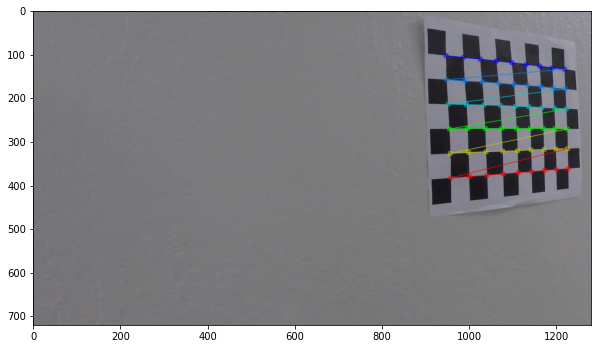

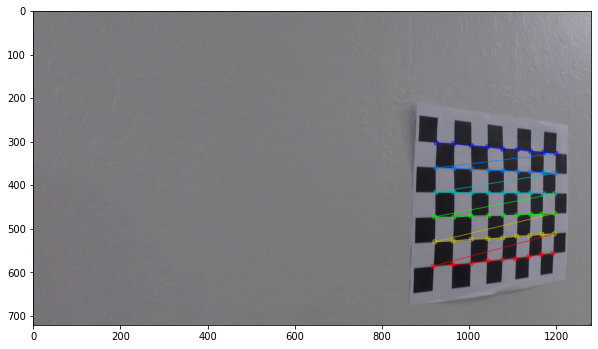

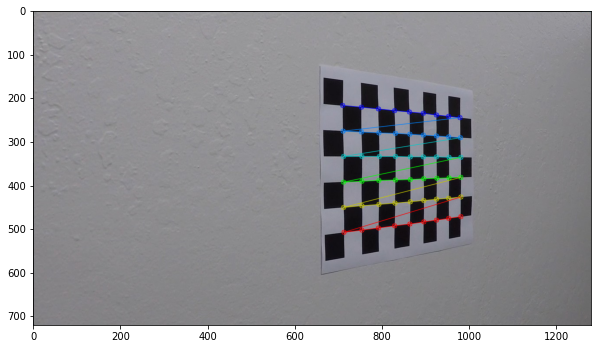

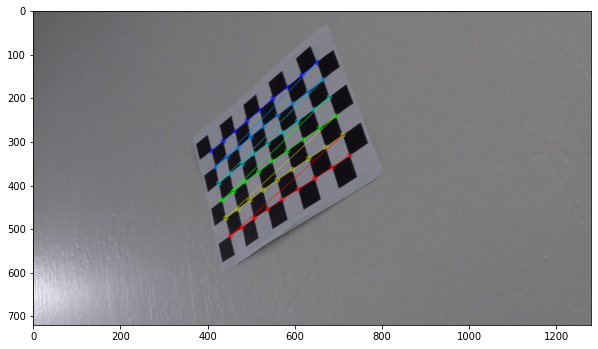

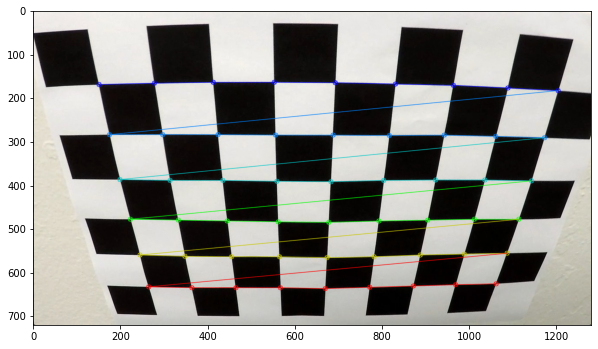

...

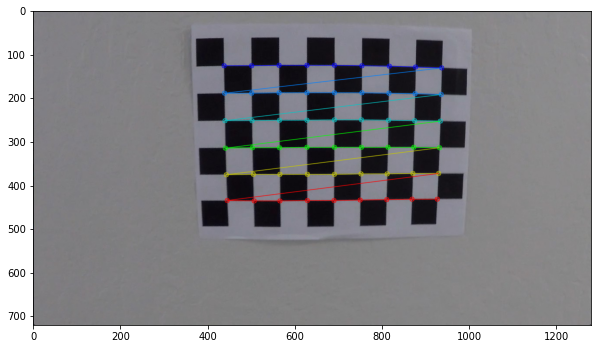

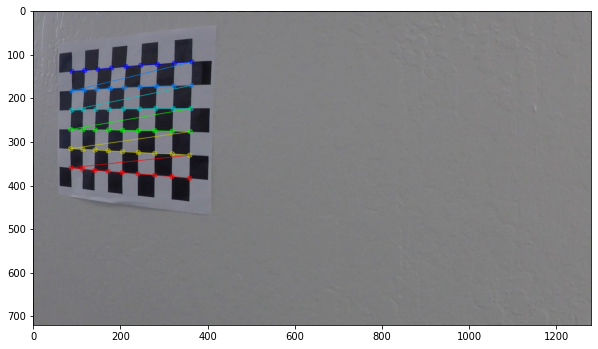

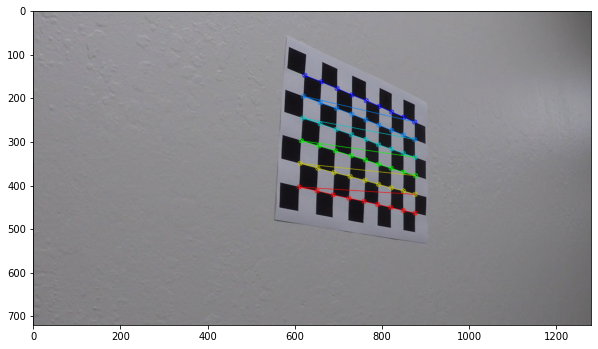

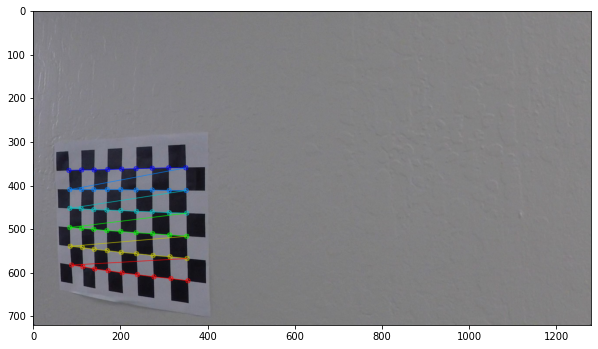

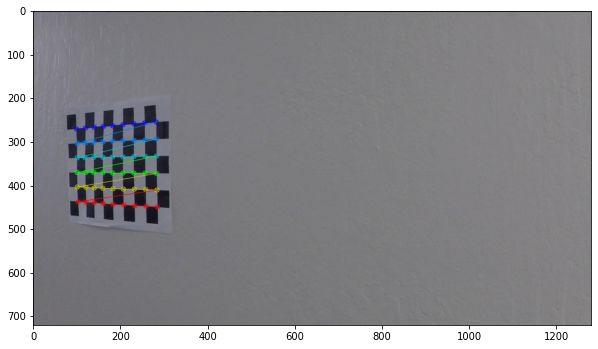

In [49]:
#3D tačke iz realnog sveta
objpoints = []
# 2D tacke sa šahovske table
imgpoints = [] 
# oblik table, broj kornera po x i y osi 
CBS = (9,6) 
objp = np.zeros((CBS[1]*CBS[0],3), dtype="float32") 
objp[:,:2] = np.mgrid[0:CBS[0],0:CBS[1]].T.reshape(-1,2)



for name in glob.glob("Calibration/calibration*.jpg"):
    image = mpimg.imread(name)
    # konvertovanje slike u grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Nalazenje kornera na šahovskoj tabli
    ret, corners = cv2.findChessboardCorners(gray, CBS, None)
    
    if ret:
        # ako su korneri detektovani prebaciti( pohraniti ) elemente u nizove
        imgpoints.append(corners)
        objpoints.append(objp)
        
        
        # prikaz slika detekcije kornera
        img = cv2.drawChessboardCorners(image,(9,6),corners,ret) # patternSize - corner dimension
        plt.figure(figsize=(10,9))
        plt.imshow(img)




In [50]:
# Funkcija za otklanjanje distorzije
def undistort(img, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

    
    return dst
        

Text(0.5, 1.0, 'Undistorted image')

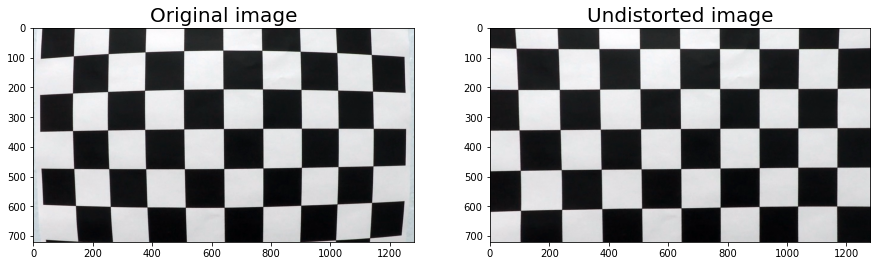

In [51]:
# Primer  efekta  otklanjanja distorzije na slici
im = cv2.imread("Calibration/test_image.jpg")
di = undistort(im,objpoints,imgpoints)

fig , (ax1, ax2) = plt.subplots(1,2,figsize=(15,10))
ax1.imshow(im)
ax1.set_title("Original image", fontsize = 20)
ax2.imshow(di)
ax2.set_title("Undistorted image", fontsize = 20)


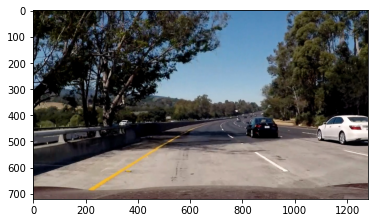

In [52]:
# Slika autoputa
test_image = mpimg.imread("TestImage/test_image_2.jpg") #RGB
plt.imshow(test_image)


Text(0.5, 1.0, 'Undistorted')

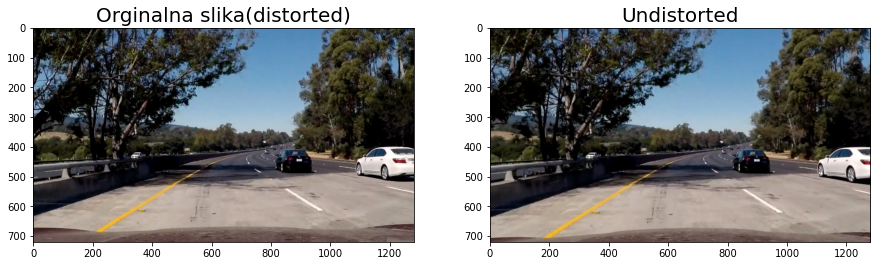

In [53]:
# Otklanjano distorziju
corr_distor  = undistort(test_image, objpoints, imgpoints)
# Vizualizacija rezulatata
fig , (ax1, ax2) = plt.subplots(1,2,figsize=(15,10))
ax1.imshow(test_image)
ax1.set_title("Orginalna slika(distorted)", fontsize = 20)
ax2.imshow(corr_distor)
ax2.set_title("Undistorted", fontsize = 20)

Text(0.5, 1.0, 'GaussianBlur & Undistorted')

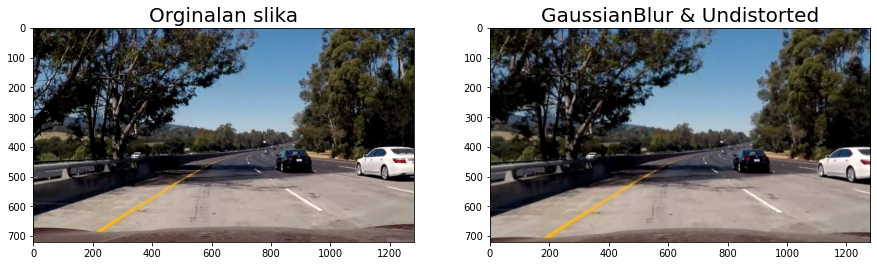

In [54]:
# Primera gausov blur na slici
GaussBlur = cv2.GaussianBlur(corr_distor,  (5,5), 0)

fig , (ax1, ax2) = plt.subplots(1,2,figsize=(15,10))
ax1.imshow(test_image)
ax1.set_title("Orginalan slika", fontsize = 20)
ax2.imshow(GaussBlur)
ax2.set_title("GaussianBlur & Undistorted", fontsize = 20)

# Izdvajanjej specificnih boja (zuta i bela) 

Text(0.5, 1.0, 'Bela linija')

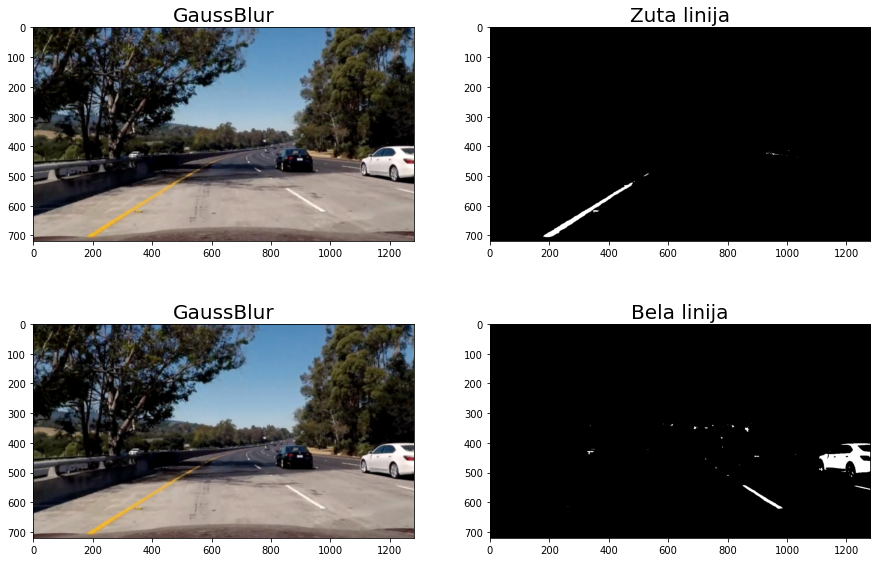

In [55]:
# Ko sto mozemo videti na slici, pojavljuju se žute i bele trake linija koje ćemo pokusati da  izolujemo sto je bolje moguće
# ekstrakcijom tih boja sa na slici

# %matplolib notebook (koritimo interaktivni mod za pronalazenje thrasholdova za žutu i belu boju)
# Prag za žutu boju (yellow thrashold)
yellow_min = np.array([150,150,0])
yellow_max = np.array([255,255,120])
# Prag za belu boju (white thrashold)
white_min = np.array([185,185,185])
white_max = np.array([255,255,255])
# primenimao inRange() funkciju koja nam omogućava ekstrakciju boje u zadatim domenima (minRGB, maxRGB) 
color_thresh_img_yellow = cv2.inRange(GaussBlur,yellow_min,yellow_max)
color_thresh_img_white = cv2.inRange(GaussBlur,white_min,white_max)

# vizualizacija
fig, axs = plt.subplots(2, 2, figsize= (15,10))
axs[0, 0].imshow(GaussBlur)
axs[0, 0].set_title('GaussBlur', fontsize=20)
axs[0, 1].imshow(color_thresh_img_yellow, cmap = "gray")
axs[0, 1].set_title('Zuta linija',fontsize=20)
axs[1, 0].imshow(GaussBlur)
axs[1, 0].set_title('GaussBlur',fontsize=20)
axs[1, 1].imshow(color_thresh_img_white, cmap ="gray")
axs[1, 1].set_title('Bela linija',fontsize=20)


# Sobel Filteri  [link]("https://towardsdatascience.com/image-derivative-8a07a4118550")



Sobel filteri se koriste za detekciju ivica na slikama. On se moze posmatrati kao alternativa za izračunavanje gradijenta funkcije. Sobelovi filteri su određeni dvema matricama $ Sobel_x = 
\begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1 \\
\end{bmatrix}
$ i $ Sobel_y = 
\begin{bmatrix}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1 \\
\end{bmatrix}
$ koje detektuju promene intenziteta na slikama, redom, duž x i y ose. Kao što ćemo videti da $Sobel_x$ filter radi veoma dobar posao prilikom detekcije linija puta. <br>__Magnituda__ ili apsolutna vrednost, od gradijenta(sobel filtera) je kvadratni koren of kvadrata za indivinualne x i y sobel filtera. Za magnitudu u oba, x i y smera je samo kvadratni koren sume kvadrata.<br>


<center>$sobel_x = \sqrt{{sobel_x}^2}$<br>
$sobel_y = \sqrt{{sobel_y}^2}$<br>
$sobel_x = \sqrt{{sobel_x}^2+ {{sobel_y}^2}}$

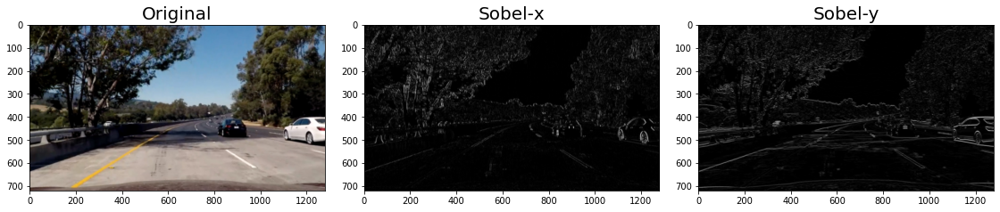

In [56]:
# Transformacija slike u grayscale mod
gray_img = cv2.cvtColor(GaussBlur, cv2.COLOR_RGB2GRAY)

# Sobel filteri u x i y smeru
sobel_x = cv2.Sobel(gray_img, cv2.CV_64F, 1,0)
sobel_y = cv2.Sobel(gray_img, cv2.CV_64F, 0,1)
# Apsolutna vrednost
sobelx_abs = np.abs(sobel_x)
sobely_abs = np.abs(sobel_y)
# Scalirajne
sobelx_scal = np.array(255*sobelx_abs/np.max(sobelx_abs), dtype ="uint8")
sobely_scal = np.array(255*sobely_abs/np.max(sobely_abs), dtype ="uint8")
 
fig, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(15, 12))
fig.tight_layout()
ax1.imshow(GaussBlur)
ax1.set_title("Original",fontsize=20)
ax2.imshow(sobelx_abs,cmap="gray")
ax2.set_title('Sobel-x', fontsize=20)
ax3.imshow(sobely_scal,cmap="gray")
ax3.set_title('Sobel-y', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


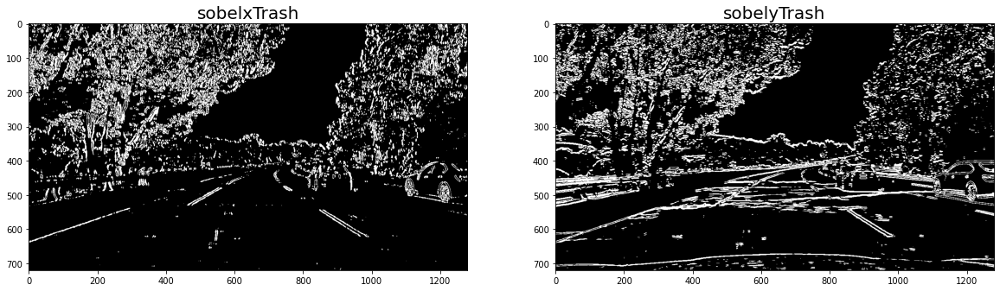

In [57]:
# Primenimo thrashold na svaki sobel filter da bismo preciznije izolovali nase linije.
# Kao sto možemo videti da je Sobel_x filter odradio veoma dobar posao 
thrash_min = 20
thrash_max = 100


sobelxTrash= np.zeros_like(sobelx_scal)
sobelyTrash = np.zeros_like(sobely_scal)

sobelxTrash[(sobelx_scal >= thrash_min) & (sobelx_scal <= thrash_max)] = 1 
sobelyTrash [(sobely_scal >= thrash_min) & (sobely_scal <= thrash_max)] = 1


fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,15))
ax1.set_title("sobelxTrash",fontsize=20)
ax1.imshow(sobelxTrash, cmap='gray')
ax2.set_title("sobelyTrash",fontsize=20)
ax2.imshow(sobelyTrash, cmap='gray')

In [58]:
# Sobel filter funkcija

def sobel_abs_thresh(img, orient = "x", sobel_kernel = 3, thresh=(145,255)):
    """
    The function will take the image and calculate the Sobel element
    on a given direction with additional filtering by threshold
    
    INPUT:
    
    img - the image represented as a numpy array
    orient - Orientation/direction of Sobel element 
    sobel_kernel-  kernel size must be odd number
    thrash - tuple that contains min and max thrashold
    
    OUTPUT:
    
    output - binary numpy array representation of Sobel element 
    
    """
    
    # Graysale mode
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # calc sobel
    if orient == "x":
        sobel = cv2.Sobel(gray_img, cv2.CV_64F, 1,0)
    elif orient =="y":
        sobel = cv2.Sobel(gray_img, cv2.CV_64F, 0,1)
    else: 
        print("Wrong orientation")
        
    # Racunjanje absolutne vrednosti
    sobel_abs = np.abs(sobel)
    
    #Scaliranje rezulata
    sobel_scal = np.array(255 * sobel_abs / np.max(sobel_abs), dtype = "uint8") 
    # Primena thrasholda
    
    output = np.zeros_like(sobel_scal)
    output[(sobel_scal >= thresh[0]) & (sobel_scal <= thresh[1])] = 1
    
    return output

In [59]:
# Magnituda 
def magnitude_thresh(img, sobel_kernel=3, thresh_m=(0, 255)):
    """
    The function calculates the magnitude of Sobel's elements and returns 
     binary numpy array that met given thresholds 
    
    INPUT:
    
    img - the image represented as a numpy array
    sobel_kernel - kernel size which must be odd number 
    thresh_m - tupe of thrasholds for filtering (min,max)
    
    OUTPUT:
    
    output - representation binary numpy array image 
    
    """
    
    
    
    # Grayscal  mod
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Racunjenje sobel fileta u oba smera
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize = sobel_kernel)
    # Racun za magnitudu
    sobel_magnitude = np.sqrt(sobelx**2 + sobely**2)
    # scaliranje
    convert = np.array(255*sobel_magnitude/np.max(sobel_magnitude),dtype = "uint8")
    # Kreiranje binarnog rezltata 
    output = np.zeros_like(sobel_magnitude)
    output[(convert >= thresh_m[0]) & (convert <= thresh_m[1])]= 1
    return output

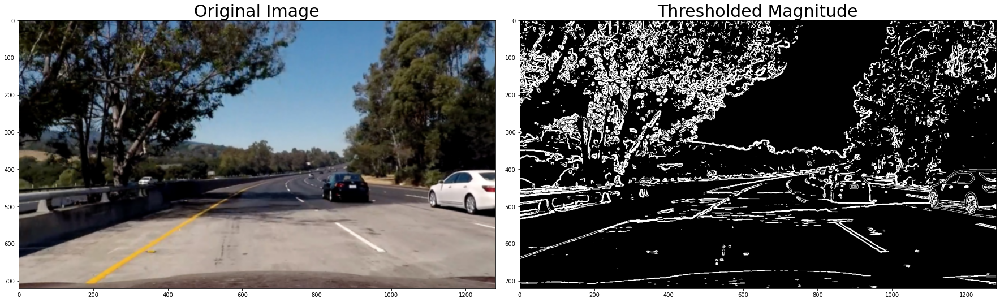

In [60]:
magnitude_bin = magnitude_thresh(GaussBlur, sobel_kernel=3, thresh_m=(30, 100))
# Vizualizacija
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
fig.tight_layout()
ax1.imshow(GaussBlur)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(magnitude_bin, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Gradient Direction

Samom primenom thrasholda na magnitudu odradili smo veoma dobar posao prilikom detekcije linija , ali takodje smo detektovali veliku količinu ostalih linija. U našem slučaju mi smo zainteresovani sam za linije specificne orijentacije. Zato sada primenjujemo orijentaciju gadijenata(Gradijent Direction) koju računamo kao:
-  $\theta = \arctan(Sobel_x/Sobel_y)$
    
    
    
<br>Svaki piksel rezultujuće slike sadrži vrednost ugla za koji se razlikuje od horizontale u radijanima. Opseg koji pokrivamo je od $-\pi/2$ do $\pi/2$, tako da vrednost $0$ implicira vertikalnu linija, dok orijentacija $\pm\pi/2$ implicita horizontalnu liniju.

In [61]:
def GraDir_thres(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    """
    The function calculates the gradient direction
    to be able to isolate just edge of particular orientation
    
    INPUT:
    
    img - the image represented as a numpy array
    sobel_kernel - kernel size which must be odd number 
    thresh - tupe of thrasholds for filtering (min,max)
    
    OUTPUT:
    
    output - representation binary numpy array image 
    
    
    """
    
    
    #Grayscale mode
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # racunjanje sobele elemenata
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1,0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0,1,ksize=sobel_kernel)
    # Racunjanje njihove apsolutne vrednost
    abs_sobelx = np.abs(sobelx)
    abs_sobely = np.abs(sobely)
    # Racunjanje orjentaicje gradijrnata
    gradDirec = np.arctan2(abs_sobely, abs_sobelx)
    # Primena thrasholda   
    output = np.zeros_like(sobelx, dtype ="uint8")
    output[(gradDirec >= thresh[0]) & (gradDirec <= thresh[1])] = 1 
    
    return output

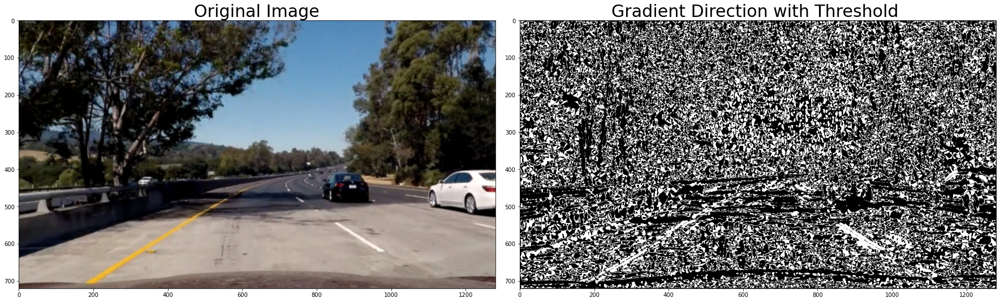

In [62]:
Grad_dir = GraDir_thres(GaussBlur, sobel_kernel=15, thresh=(0.7, 1.3))
# vizualizacija
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
fig.tight_layout()
ax1.imshow(GaussBlur)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(Grad_dir, cmap='gray')
ax2.set_title('Gradient Direction with Threshold ', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [63]:
# Sada cemo iskombinocati sve elemente(sobelx,sobely,magnitudu i ojentaciju gradijenta) da bismo ektrakovali željene linije

# Biramo kernel vrednosti
ksize = 3 # Biranjem veće ksize vrednsoti, dobijamo glatkije gradijente 

gradx = sobel_abs_thresh(GaussBlur, orient='x', sobel_kernel=ksize, thresh=(20, 100))
grady = sobel_abs_thresh(GaussBlur, orient='y', sobel_kernel=ksize, thresh=(20, 100))
mag_binary = magnitude_thresh(GaussBlur, sobel_kernel=ksize, thresh_m=(20, 100))
dir_binary = GraDir_thres(GaussBlur, sobel_kernel=ksize, thresh=(0.7, 1.3))

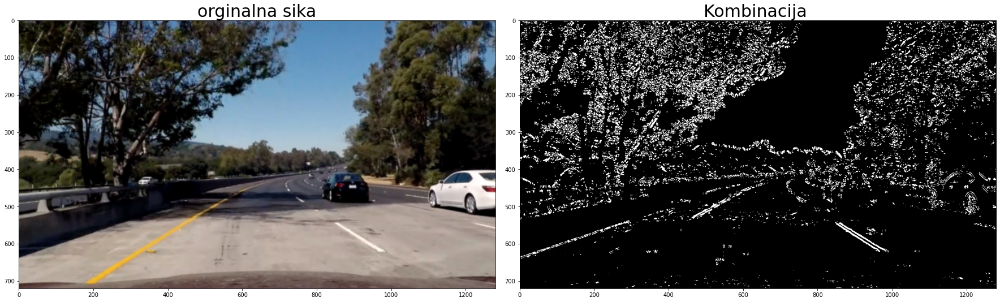

In [64]:
combined = np.zeros_like(dir_binary, dtype="uint8")
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
fig.tight_layout()
ax1.imshow(GaussBlur)
ax1.set_title('orginalna sika', fontsize=30)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Kombinacija ', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Palete boja (Color spaces)

__Color spaces__ - su specificne palete boja, koje daju način za kategorizaciju boja i njihovu reprezentaciju u digitalnim  slikama. <br>
__RGB__(Red-Green-Blue) je jedna od paleta boja, možemo razmišljati o ovoj palati boja kao kocki u 3D prostoru, gde svaka boja moze biti predstaljena sa 3D kordinatama (R,G,B), čije vrednosti se nalaze u opsegu od 0 to 255. Na primer bela boja ima kordinate (255,255,255), koje su maksimalne vrednsti za red, green i blue elemente.

<img src="img/rgb.png" width="500" height="540">


Postoje još drugacijuh načina za reprezentaciju boja sem RGB palete.
Takodje tu je i __HSV__ paleta boja(hue, saturation and value) i __HLS__ paleta (hue,lightness and saturation). Ovu su neka od najkorišcenijih paleta boja.<br> Da bimo imali neku intuiciju za ove palete boja, mozemo generalno razmišljati o __Hue__ kao vrednost koja predstavlja promenu svetlosti u boji. Ako zamislimo osnovnu crvenu boju, ako dodamo neku količinu bele, ili neku količinu crne možemo dobiti crvenu boju koja je ili svetlia ili tamnija, ali ove boje dele istu __hue__ vrednost. Sa druge strane __Lightness__ i __Value__ predstavljaju drugacije načine merenja svetlosti ili tamnoce boje. Npr: Tamnije crvena će imati sličan __hue__ ali mnogo manju vrednost za svetlost od svetle crvene boje.  __Saturation__ takodje ima ulogu u ovome, ona meri punocu boje. Kako boje postaju svetlije i bliza beloj, one imaju sve manju saturationu vrednost, kako boja postaje sve intenzivnija one imaju veću saturationu vrednost. Intuiciju mozemo upotpuniti sa slikom. <img src  = "img/HSV.png"> <br>
OpenCv nam daje funciju koje nam omogucava da  prelazimo sa jedne palete na drugu __cvtColor()__. Koristimo ove palete da bismo  detektovali linije drugacijih boja ili svetlosti usled,recimo senki koje se nalaze na putu.

## RGB Color Space

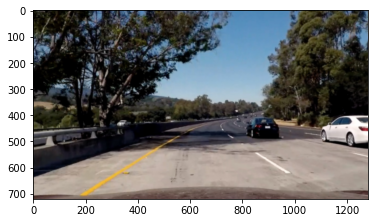

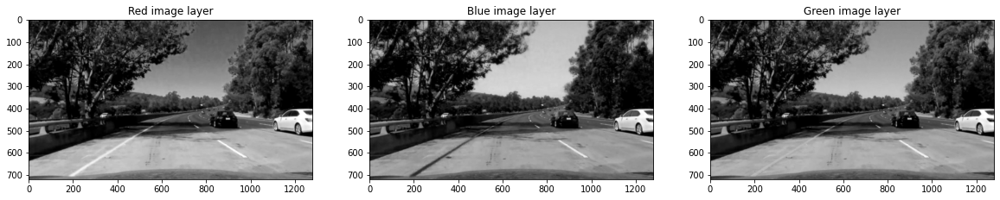

In [65]:
R = GaussBlur[:,:,0]
G = GaussBlur[:,:,1]
B = GaussBlur[:,:,2]
plt.imshow(GaussBlur)

# Vizualizacija 

fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(20,15))
ax1.set_title("Red image layer")
ax1.imshow(R,cmap ="gray" )
ax2.set_title("Blue image layer")
ax2.imshow(B,cmap="gray")
ax3.set_title("Green image layer")
ax3.imshow(G,cmap="gray")
# Možemo videti da je najbolji kanal za detekciju linija je Crveni(Red kanal)

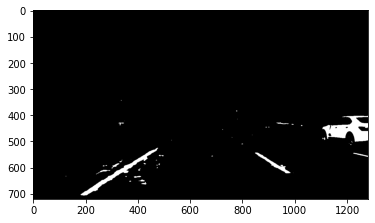

In [66]:
# Primenom thrasholda dobijamo binarnu sliku na kojoj možemo dobro detekovati liniju
thresh = (200,255) 
binar = np.zeros_like(R)
binar[(R>= thresh[0]) & (R <= thresh[1])] = 1
plt.imshow(binar, cmap = "gray")

# HLS Color Space

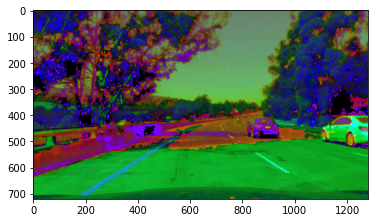

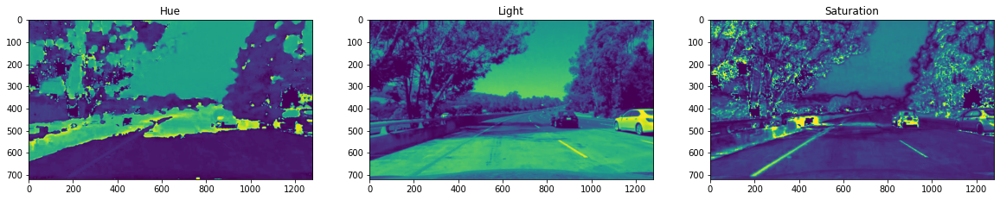

In [67]:
# Menjamo paletu RGB --> HLS 
hls_channel = cv2.cvtColor(GaussBlur,cv2.COLOR_RGB2HLS)
plt.imshow(hls_channel)

H = hls_channel[:,:,0]
L = hls_channel[:,:,1]
S = hls_channel[:,:,2]

# vizualizacija

fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(20,15))
ax1.set_title("Hue")
ax1.imshow(H)
ax2.set_title("Light")
ax2.imshow(L)
ax3.set_title("Saturation")
ax3.imshow(S)

# U ovoj paleti možemo videti da je Saturation kanal najbolji za izolaciju linija

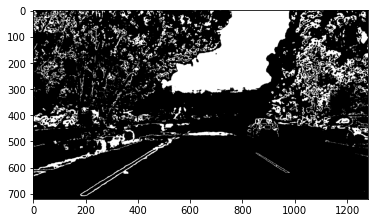

In [68]:
# Primenimo thrashold da bismo dobro izolovali linije
thresh = (90,160)#(90,255)
binar_hls = np.zeros_like(S)
binar_hls[(S >= thresh[0]) & (S <= thresh[1])] = 1
plt.imshow(binar_hls, cmap = "gray")

# HSV Color Space

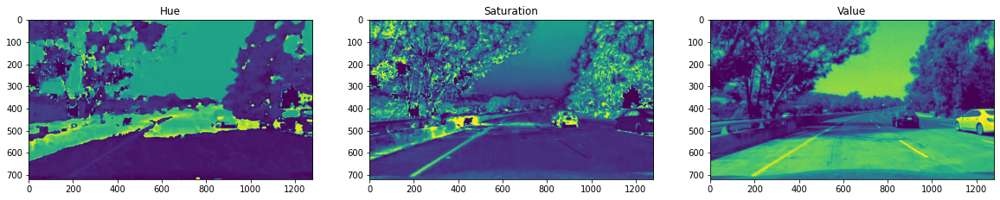

In [69]:
# Menjamo paletu RGB --> HSV 

hsv_channel = cv2.cvtColor(GaussBlur,cv2.COLOR_RGB2HSV)

H = hsv_channel[:,:,0]
S = hsv_channel[:,:,1]
V = hsv_channel[:,:,2]

# Vizualizacija 

fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(20,15))
ax1.set_title("Hue")
ax1.imshow(H)
ax2.set_title("Saturation")
ax2.imshow(S)
ax3.set_title("Value")
ax3.imshow(V)

# Najbolji kanal u ovoj paleti je Value kanal i koristicemo je  kao  i za ove gore za dalje filterisanje slike


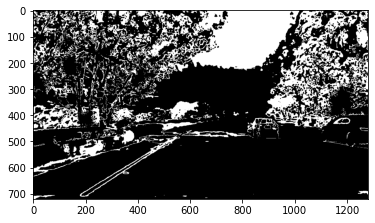

In [70]:
thresh = (90,160)
binar_hls = np.zeros_like(V)
binar_hls[(S >= thresh[0]) & ( S<= thresh[1])] = 1
plt.imshow(binar_hls, cmap ="gray")

Text(0.5, 1.0, 'Kombinacija')

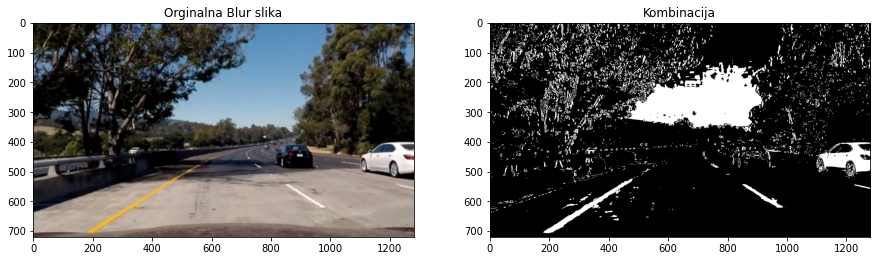

In [71]:
# Sada ćemo iskombinovati Red kanal, S kanal, C kanal..  

hls_s_threshold = (180, 200)
sobel_x_threshold = (40, 100)
hsv_v_treshold = (200, 215)


# Izolacija crvenog kanala iz RGB palete boja
color_channel = GaussBlur[:,:,2]

# Konvertovanje u HLS kolor mapu i izolacija S kanala
hls_channel = cv2.cvtColor(GaussBlur, cv2.COLOR_RGB2HLS)[:,:,2]

# Konvertovanje u HSV kolor mapu i izolocija V kanala
hsv_channel = cv2.cvtColor(GaussBlur, cv2.COLOR_RGB2HSV)[:,:,2]

# Izolacija žute boje 
yellow_mask = cv2.inRange(GaussBlur, np.array([150, 150, 0]), np.array([255, 255, 120]))

# Izolacija bele boje
white_mask = cv2.inRange(GaussBlur, np.array([185, 185, 185]), np.array([255, 255, 255]))

# Primena Sobel filtera u x pravcu
sobelx = cv2.Sobel(color_channel, cv2.CV_64F, 1, 0) 
abs_sobelx = np.absolute(sobelx)
scaled_sobel = np.array(255*abs_sobelx/np.max(abs_sobelx), dtype="uint8")

# Primena thrasholda na gradijent u x smeru
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= sobel_x_threshold[0]) & (scaled_sobel <= sobel_x_threshold[1])] = 1

# Primena thrasholda na izdvojeni S kanal
hls_s_binary = np.zeros_like(hls_channel)
hls_s_binary[(hls_channel >= hls_s_threshold[0]) & (hls_channel <= hls_s_threshold[1])] = 1

# Primena thrasholda na V kanal
hsv_s_binary = np.zeros_like(hsv_channel)
hsv_s_binary[(hsv_channel >= hsv_v_treshold[0]) & (hsv_channel <= hsv_v_treshold[1])] = 1

# Kreiranje zute i bele maske
yellow_binary = np.array(yellow_mask // 255, dtype="uint8")
white_binary = np.array(white_mask // 255, dtype="uint8")

# Kombinacija svih pomenutih elemenata
combined_binary = np.zeros_like(sxbinary)
combined_binary[(hls_s_binary == 1) | (sxbinary == 1) | (hsv_s_binary == 1) | (yellow_binary == 1) | (white_binary == 1)] = 1

fig , (ax1,ax2) = plt.subplots(1,2,figsize =(15,10))
ax1.imshow(GaussBlur)
ax1.set_title("Orginalna Blur slika")
ax2.imshow(combined_binary, cmap ="gray")
ax2.set_title("Kombinacija")

# Ekstrakcija specificnog dela slike 

Zainteresovani smo za deo slike koji sadrzi linije traka na autoputu, sve ostale delove slike mozemo zanemariti.


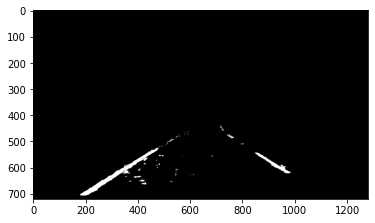

In [72]:
# Nalazimo tačke na slici koje kreiraju oblast na koju želimo da bacimo fokus 
points = np.array([[130, combined_binary.shape[0]], 
                     [625, combined_binary.shape[0]*0.6], 
                     [700, combined_binary.shape[0]*0.6], 
                     [1200, combined_binary.shape[0]]], np.int32)

# Kreiramo praznu masku 
mask = np.zeros_like(combined_binary)   


# Koristimo OpenCv funkciju da bismo  definisali poligon    
cv2.fillPoly(mask,[points], color=(255,0,0))

# Vraćamo sliku samo na delovima gde su pikseli maske ne nula 
masked_image = cv2.bitwise_and(combined_binary, mask)

plt.imshow(masked_image,cmap="gray")

# Perspektivna transformacija (Perspective transform) 

Kada ljucko oko posmatra neki predmet koji je blizu, taj predmet izgleda veći u onosu na isti koji se nalazi na nekoj udaljenosti. Ovaj efekat se naziva perspektiva, tok je transformacija prekos jednog objkta iz jednog stanja u drugo. Dakle generalno, perspektivna transformacija radi konverziju iz 3D prostora u 2D prostor.
Tako da ce perspektivna transforamcija u našem slučaju mapirati tačke u zadatoj slici u neku druge, zeljene, tačke slike tako kreirajuci novu perspektivu. Naša perspektivna transformacija za koju smo najvise zanteresovani je pogled odozgo(bird’s eye view), na osnovu koje ćemo moći da posmatramo linije puta odozgo. Ovo ce nam biti od velike koristi kada budemo računali zakrivljnost linija.

OpenCv nam je obezbedio funkciju __getPerspectiveTransform()__ koja nam omogućava ovu transformaciju.

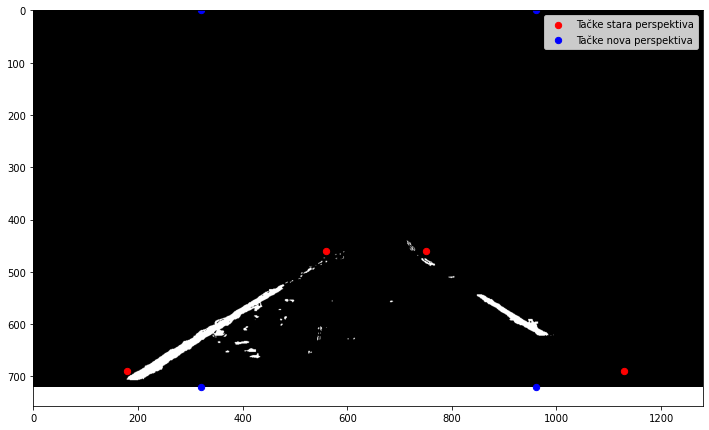

In [73]:
plt.figure(figsize=(12,8))
plt.imshow(masked_image,cmap="gray")
plt.scatter(x=[560, 180, 1130, 750], y=[460, 690, 690, 460], c='r', s=40,label='Tačke stara perspektiva')
plt.scatter(x=[320, 320, 960, 960], y=[0, 720, 720, 0], c='b', s=40,label='Tačke nova perspektiva')
plt.legend()

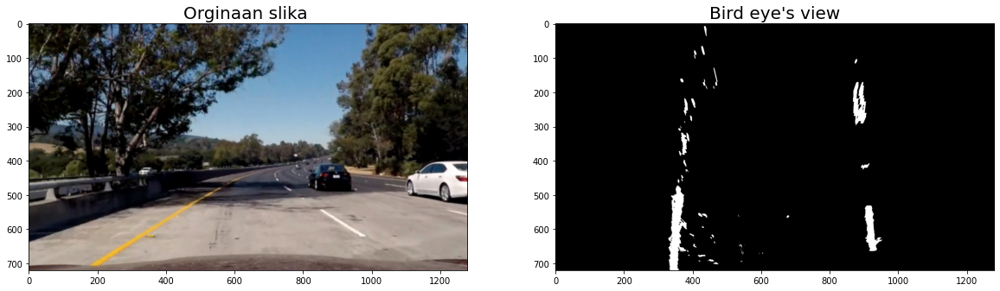

In [74]:
# Perspektivna transfrmacija
# odabir tacaka na slici
src = np.array([[560,460],[180,690],[1130,690],[750,460]],dtype="float32")
# tacke za novu željenu perspektivu
dst = np.array([[320,0],[320,720],[960,720],[960,0]],dtype="float32")

M = cv2.getPerspectiveTransform(src, dst) # matrica transformacije
Minv = cv2.getPerspectiveTransform(dst, src) # inverzna matrica transformacije

transformed_img = cv2.warpPerspective(masked_image, M, (masked_image.shape[1], masked_image.shape[0]), flags=cv2.INTER_LINEAR)
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,15))
ax1.set_title("Orginaan slika ", fontsize = 20)
ax1.imshow(GaussBlur)
ax2.set_title("Bird eye's view", fontsize = 20)
ax2.imshow(transformed_img, cmap = "gray")

plt.savefig('{}/{}'.format("src/", "Perspective_transform"))

# Lociranje linija traka

Postoje različite metode, mi ćemo koristiti, metodu pronalazenja linija  pomoću vrhovima u histogramu.<p>Posle primene kalibracije, thresholdova i perspektivne transformacije na slici, kao rezultat treba da imamo sliku binarne reprezentacije, na kojoj se moze lako uočiti trake puta. Sada da bismo odredli koji pikseli pripadaju elementima leve i desne trake, iscrtavamo histogrma koji zavisi od broja aktivnih piksela na slici sumiranjem svih piksela po vertikali, uočavanjem poziciji pikova na histogramu indentifikujemo pocetak(bazi) leve i desnelinije trakeŽ. 

In [75]:
img = np.copy(transformed_img)


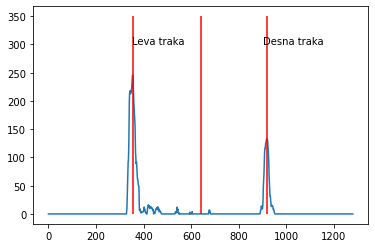

In [83]:

histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
midpoint = np.int(histogram.shape[0]//2)
leftx_line = np.argmax(histogram[:midpoint])
rightx_line = np.argmax(histogram[midpoint:]) + midpoint
plt.plot(histogram)
plt.annotate("Leva traka", xy=(250, 20), xytext=(350, 300))
plt.annotate("Desna traka", xy=(250, 20), xytext=(900, 300))
plt.vlines([leftx_line, midpoint, rightx_line], 0,350,"r")

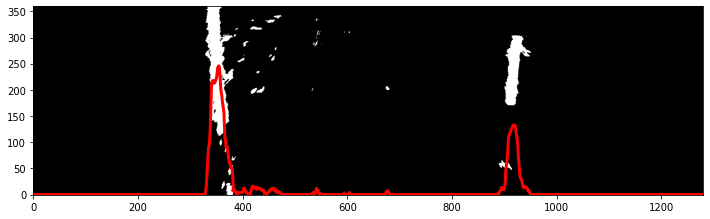

In [84]:
plt.figure(figsize=(12,10))
bottom_part = transformed_img[transformed_img.shape[0]//2:,:]
bottom_half = img[img.shape[0]//2:,:]
plt.imshow(bottom_half, cmap ="gray")
histogram = np.sum(bottom_half, axis=0)
plt.plot(histogram, c="r", lw =3);
plt.gca().invert_yaxis()

In [32]:
def blur_image(img, kernel_size=(5,5)):
    """
    Function does Gaussian Blur on the image with specific kernel size
    
    INPUT:
    img - the image represented as a numpy array
    kernel_size - need to be odd number 
    
    OUTPUT:
    output - numpy arrey image prepresentation
    """
    
    return cv2.GaussianBlur(img, kernel_size, 0)

def combined_img(img, s_threshold=(180, 215), sobel_x_threshold=(50, 90), hsv_v_threshold=(200, 215)):
    """
    Function combining specific color channels with Sobel-x element and yellow and white masks 
    with addition threshold for image filtering
    
    INPUT:
    
    img - the image represented as a numpy array
    thrasholds:
    s_threshold - saturation trashold for S channel 
    sobel_x_threshold
    hsv_s_threshold
    
    OUTPUT:
    
    output - binar numpy arrey image prepresentation
    
    """
        
    # Izolacija crvenog kanala iz RGB palete boja
    color_channel = img[:,:,0]

   # Konvertovanje u HLS kolor mapu i izolacija S kanala
    HLS_channel = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,2]

    # Konvertovanje u HSV kolor mapu i izolocija V kanala
    HSV_channel = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)[:,:,2]

    # Izolacija žute boje
    yellow_mask = cv2.inRange(img, np.array([150, 150, 0]), np.array([255, 255, 120]))

    # Izolacija bele boje
    white_mask = cv2.inRange(img, np.array([185, 185, 185]), np.array([255, 255, 255]))

    # Primena Sobel filtera u x pravcu
    sobelx = cv2.Sobel(color_channel, cv2.CV_64F, 1, 0) 
    abs_sobelx = np.abs(sobelx)
    scaled_sobel = np.array(255*abs_sobelx/np.max(abs_sobelx), dtype="uint8")

    # Primena thrasholda na gradijent u x smeru
    sxbinar = np.zeros_like(scaled_sobel)
    sxbinar[(scaled_sobel >= sobel_x_threshold[0]) & (scaled_sobel <= sobel_x_threshold[1])] = 1

    # Primena thrasholda na izdvojeni S kanal
    hls_s_binar = np.zeros_like(hls_channel)
    hls_s_binar[(hls_channel >= s_threshold[0]) & (hls_channel <= s_threshold[1])] = 1

    # Primena thrasholda na V kanal
    hsv_v_binar = np.zeros_like(hsv_channel)
    hsv_v_binar[(hsv_channel >= hsv_s_threshold[0]) & (hsv_channel <= hsv_s_threshold[1])] = 1

    # Kreiranje zute i bele maske
    yellow_binar = np.array(yellow_mask // 255, dtype ="uint8")

    # Kombinacija svih pomenutih elemenata
    white_binar = np.array(white_mask // 255, dtype="uint8")

    combined_binar = np.zeros_like(sxbinar)
    combined_binar[(hls_s_binar == 1) | (sxbinar == 1) | (hsv_s_binar == 1) | (yellow_binar == 1) | (white_binar == 1)] = 1   
        
    return combined_binar
        

def region_of_interest(img, points):
    
    """
    Finding the area of interest
    
    INPUT:
    img - the image represented as a numpy array
    points - coordinates which correspond to the corners of wanted region from the image
    
    OUTPUT:
    output - image numpy array 
    
    """
    
    #definisemo maku
    mask = np.zeros_like(img)   
    
        
    #Definisemo poligon  
    cv2.fillPoly(mask, np.int32([vertices]), (255,0,0))
    
    #Vracamo sliku 
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def perspective_transform(img):
    """
    Function doing perspective transform (bird eye view) 
    """
    
    # Tack nove i stare perspektive
    src = np.float32([[560,460],[180,690],[1130,690],[750,460]])
    dst = np.float32([[320,0],[320,720],[960,720],[960,0]])

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    transformed_img = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    return Minv, transformed_img
    


In [33]:
def find_lane_pixels(img, nwindows=9, margin=100, minpix=50):
    """
        Function find the lines in the top down iamge
        
        INPUT:
        
        img - the image represented as a numpy array
        nwindows - the number of sliding windows
        margin - width of the windows +/- margin
        minpix - minimum number of pixels found to recenter window
        
        OUTPUT:
        
        leftx - x-axis value of the left lane
        lefty - y-axis value of the left lane 
        rightx - x-axis value of the right lane 
        righty - y-axis value of the right lane 
        radius -  mean radius in meters of the left and right lane curvature 
        offset - distance in meters from the center of the lane
        out_img - numpy array representation of the lane detection image
    """
    

    
    # Izdvajamo histigram donje polovine slike 
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)

    # Kreiramo output sliku na kojoj cemo vizualizovati rezultat
    out_img = np.dstack((img, img, img))
    
    # Pronalazimo pikove na levom i desnoj polovini histograma 
    # to ćn na biti indikatori (pocetne tacke) nasih levih i denih linija traka

    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Kreiramo velicinu prozora koje ce klititi po slici, koja zavisi od nwindows (broja prozora)   
    window_height = np.int(img.shape[0]//nwindows)
    # Detektujemo x i y pozicije svih nenula piksela na slici
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Trenutna pozicija se menjati za svaki prozor od njih nwindows 
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Kreiramo prazne nizove u kojima cemo skladistiti indektifikatore piksela za lefu i denu traku 
    left_lane_inds = []
    right_lane_inds = []

    # Prolazimo prozor po prozor
    for window in range(nwindows):
        # Definisemo prozore za levu i denu traku

        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Isrtamo prozore za slici
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Intentifikujemo nenula piksele koji upadnu u prozore
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Te intentifikatore pohranimo u pomenute nizove 
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # Ako se pronadjeno vise od minpix piksela, recentriramo novi prozor

        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Konkatinacija nizova za cuvanje "dobrih" piksela (pre toga je to bila lista of listi)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Izbeganjanje greske prilikom konkatinacije
        pass

    # Izdvajanje pozicija piksele leve i desne trake
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Tranformacije iz prostora piksela u relni prostor pix -> metar
    
    ym_per_pixel = 30/720 
    xm_per_pixel = 3.7/700 
    
    left_fit_m = np.polyfit(lefty*ym_per_pixel, leftx*xm_per_pixel, 2)
    right_fit_m = np.polyfit(righty*ym_per_pixel, rightx*xm_per_pixel, 2)
    
    radius, offset = radius_and_offset(left_fit_m, right_fit_m, ym_per_pixel, xm_per_pixel)

    # bojenje piksel traka i iscrtavanje polinoma
    
    lane_pixel_img = np.dstack((img, img, img))*255
    lane_pixel_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    lane_pixel_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    return leftx, lefty, rightx, righty, radius, offset, out_img

def draw_polynomial(img, fit):
    
    
    y = np.linspace(0, img.shape[0]-1, img.shape[0])
    x = fit[0]*y**2 + fit[1]*y + fit[2]
    pts = np.array([np.transpose(np.vstack([x, y]))])
    cv2.polylines(img, np.int_(pts), isClosed=False, color=(255, 255,0), thickness=5)

def fit_polynomial(img):
    """
    Function from image fit a secound order polynomial to the detction lines
    
    
    INPUT:
        img -  numpy array representation of an image
    OUTPUT:
    
        ploty - np.array of evenly spaced numbers over a specified interval
        left_fit - polynomial coefficients of the left lane
        right_fit - polynomial coefficients of the right lane
        radius: mean radius in meters of the left and right lane curvature 
        offset: distance in meters from the center of the lane
    """
    
    # Pronalazimo piksela traka
    leftx, lefty, rightx, righty, radius, offset, out_img = find_lane_pixels(img)
    
    # Fitujemo polonom drugog stepena za svaku traku kotiscenjem polyfit funkcije
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Kreiramo x i y vrednosti za iscrtavanje
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # izbegavano gresku ako su left and right_fit jos prazne ili netacke
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    # vizualizacija
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    draw_polynomial(out_img, left_fit)
    draw_polynomial(out_img, right_fit)
    
    return ploty, left_fit, right_fit, radius, offset, out_img

def draw(original_img, img, left_fit, right_fit, Minv):
    """
    
    From given an image, draw a filled polygon of the lane
    
    INPUT:
        original_img - numpy array representation of the original image 
        img  -  numpy array representation of an image
        left_fit  - polynomial coefficients of the left lane
        right_fit - polynomial coefficients of the right lane
        Minv : the inverse perspective transform
        
    Returns:
        result: numpy array representation of the lane detected image
    """
    
    
    # Kreiramo praznu sliku za vizualizaciju
    warp_zero = np.zeros_like(img, dtype = "uint8")
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
    leftx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    rightx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # tranformacija x i y tacaka u formi koja se koristi u cv2.fillPoly
    
    pts_left = np.array([np.transpose(np.vstack([leftx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([rightx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # iscrtavanje traka na kreiranoj slici gore
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Vracamo se iz pticije perspektive u perspektivu ljuckog oko
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # kombinacija rezultata sa orginalnim slikom
    result = cv2.addWeighted(original_img, 1, newwarp, 0.3, 0)
    return result

def radius_and_offset(left_fit, right_fit, ym_per_pixel, xm_per_pixel):
    """
        Get the radius of a lane and the offset of the camera
        
        INPUT:
        
        left_fit -  polynomial coefficients of the left lane, highest power first
        right_fit - polynomial coefficients of the right lane, highest power first
        ym_per_pixel - 
        xm_per_pixel -         
        
        OUTOUT:
        
        radius -  median radius in meters of the left and right lane curvature 
        offset -  distance in meters from the center of the lane
    """
    
    left_curverad =  ((1 + (2*left_fit[0]*720*ym_per_pixel + left_fit[1])**2)**(3/2))/np.abs(2*left_fit[0])
    right_curverad =  ((1 + (2*right_fit[0]*720*ym_per_pixel + right_fit[1])**2)**(3/2))/np.abs(2*right_fit[0])
    
    left_lane = left_fit[0]*(720*ym_per_pixel)**2 + left_fit[1]*720*ym_per_pixel + left_fit[2]
    right_lane = right_fit[0]*(720*ym_per_pixel)**2 + right_fit[1]*720*ym_per_pixel + right_fit[2]
    
    radius = np.mean([left_curverad, right_curverad])
    offset = [640*xm_per_pixel - np.mean([left_lane, right_lane]), right_lane-left_lane]
    return radius, offset

def add_text(text_img, radius, offset):
    
    """Add the text info which corresponds to the radius and offset to an image
    
    INPUT:
        text_img -  numpy array representation of an image 
        radius -  median radius in meters of the left and right lane curvature 
        offset -  distance in meters from the center of the lane

    OUTPUT:
        result_img - numpy array representation of an image with added text
    """
    
    # Prikazivanje radijuca zakrivljenja i odstupanja od centra
    cv2.putText(text_img, f'Radius of Curvature: {round(radius)} m', (50, 100), cv2.FONT_HERSHEY_COMPLEX, 1, (255, 255, 255), 4)
    cv2.putText(text_img, f'Center Offset: {round(offset[0], 3)} m', (50, 150), cv2.FONT_HERSHEY_COMPLEX, 1, (255, 255, 255), 4)
    
    return text_img

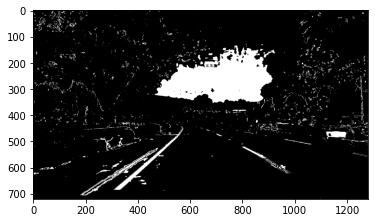

In [34]:
img = mpimg.imread('TestImage/image5.jpg')
a=combined_img(img, s_threshold=(180, 215), sobel_x_threshold=(50, 90), hsv_s_threshold=(200, 215))
plt.imshow(a,cmap="gray")

# Testiranje na slici

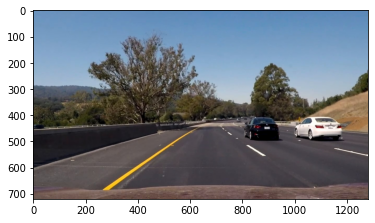

In [35]:
img = mpimg.imread('TestImage/image8.jpg')
img_copy = np.copy(img)
plt.imshow(img_copy)

# Primena distorzije
distortion_corrected_img = undistort(img_copy, objpoints, imgpoints)

# Blurovanje slike
blurred_img = blur_image(distortion_corrected_img)

# Koricenje kolor paleta, trasholda....
combined_binary_img = combined_img(blurred_img)

# Fokusiranje na zeljeni region slike
vertices = np.array([[130, combined_binary.shape[0]], 
                     [625, combined_binary.shape[0]*0.6], 
                     [700, combined_binary.shape[0]*0.6], 
                     [1200, combined_binary.shape[0]]], np.int32)
roi_img = region_of_interest(combined_binary_img, [vertices])

# Primena pticije perspektive
Minv, binary_warped = perspective_transform(roi_img)

# detekcija piksela traka
ploty, left_fit, right_fit, radius, offset, polyfit_img = fit_polynomial(binary_warped)

# detektovane trake linija vracamo u pocetnu perspektivu ljuckog oka
projected_lanes_img = draw(img_copy, binary_warped, left_fit, right_fit, Minv)

# racunjanje i prikaz zakrivljenosti i odstupanja vozila
out_img = add_text(projected_lanes_img, radius, offset)

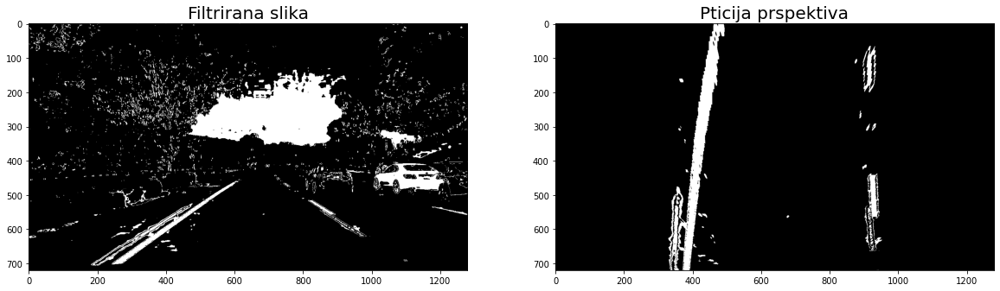

In [36]:
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,15))
ax1.set_title("Filtrirana slika", fontsize = 20)
ax1.imshow(combined_binary_img, cmap ="gray")
ax2.set_title("Pticija prspektiva", fontsize = 20)
ax2.imshow(binary_warped,cmap="gray")

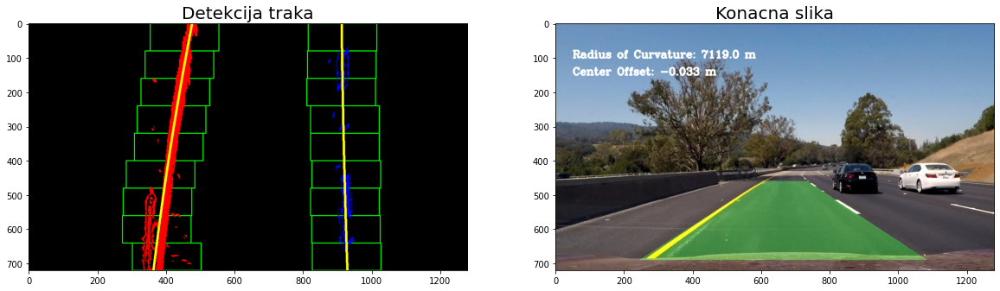

In [37]:
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,15))
ax1.set_title("Detekcija traka", fontsize = 20)
ax1.imshow(polyfit_img)
ax2.set_title("Konacna slika", fontsize = 20)
ax2.imshow(out_img)

# Implementacija na Videu

In [38]:
class PipelineVideo(object):
    def __init__(self):
        self.frame_ind = 0
        self.left_fit = None
        self.right_fit = None
        self.radius = None
        self.offset = None
        self.frames = {}
    
    def update_radius_delta(self, radius):
        if (self.frame_ind == 0) | (self.radius is None):
            return 0
        else:
            return abs((radius-self.radius)/self.radius)
        
    def update_offset_delta(self, offset):
        if (self.frame_ind == 0) | (self.offset is None):
            return 0
        else:
            offset[0]
        return abs((offset[0]-self.offset[0])/self.offset[0])

In [39]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)

def image_pipeline(img, pipeline):
    img_copy = np.copy(img)
    
    # AKOrekcija distorzije
    distortion_corrected_img = cv2.undistort(img_copy, mtx, dist, None, mtx)

    # KOmbinacija trhasholda za palete boje, gradijenata...
    combined_binary_img = combined_img(distortion_corrected_img)
    
    # Fokusiranje na određeni region slike
    points = np.array([[150, combined_binary_img.shape[0]], 
                         [580, combined_binary_img.shape[0]*0.6], 
                         [745, combined_binary_img.shape[0]*0.6], 
                         [1150, combined_binary_img.shape[0]]], np.int32)
    roi_img = region_of_interest(combined_binary_img, [points])

    # primena birds-eye view.
    Minv, binary_warped = perspective_transform(roi_img)

    # Detekcija, fitovanjem radijus...
    ploty, left_fit, right_fit, radius, offset, out_img = fit_polynomial(binary_warped)
    
    pipeline.frames[pipeline.frame_ind] = {
        'left_fit': left_fit,
        'right_fit': right_fit,
        'radius': radius,
        'radius_delta': pipeline.update_radius_delta(radius),
        'offset': offset,
        'offset_delta': pipeline.update_offset_delta(offset),
        'updated': True
    }

    if pipeline.frame_ind == 0:
        pipeline.offset = offset
        pipeline.radius = radius
        
    # Ako su promene sa prethodnog frame prevelike koristi elemente sa prethodnog frame
    
    if ((pipeline.radius < 1000) & (abs((radius-pipeline.radius)/pipeline.radius) > 30)) & \
       (pipeline.frame_ind > 0):
        pipeline.frames[pipeline.frame_ind]['updated'] = False
        left_fit = pipeline.left_fit
        right_fit = pipeline.right_fit
        radius = pipeline.radius
        offset = pipeline.offset

    # isrctavanje detektovanih linja
    projected_lanes_img = draw(img_copy, binary_warped, left_fit, right_fit, Minv)

    # racunjanje i ispis teksta
    out_img = add_text(projected_lanes_img, radius, offset)
    
    pipeline.frame_ind += 1
    pipeline.left_fit = left_fit
    pipeline.right_fit = right_fit
    pipeline.radius = radius
    pipeline.offset = offset

    return out_img

In [40]:
pipeline = PipelineVideo()
video_out = 'project_video111.mp4'

video_clip = VideoFileClip("VideoData/project_video.mp4")
clip = video_clip.fl_image(lambda x: image_pipeline(x, pipeline))
%time clip.write_videofile(video_out, audio=False)

Moviepy - Building video project_video111.mp4.
Moviepy - Writing video project_video111.mp4



Moviepy - Done !
Moviepy - video ready project_video111.mp4
CPU times: user 3min 45s, sys: 23.8 s, total: 4min 9s
Wall time: 2min 51s


In [41]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_out))